In [1]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder 
import seaborn as sns
import matplotlib.pyplot as plt

**Reading the Data and first Observing the Data**

In [2]:
data =pd.read_csv(r'/kaggle/input/30000-spotify-songs/spotify_songs.csv')
df=data.copy()

In [3]:
df.head()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,189052


In [4]:
for col in df.columns:
    print(col,df[col].isna().sum())

track_id 0
track_name 5
track_artist 5
track_popularity 0
track_album_id 0
track_album_name 5
track_album_release_date 0
playlist_name 0
playlist_id 0
playlist_genre 0
playlist_subgenre 0
danceability 0
energy 0
key 0
loudness 0
mode 0
speechiness 0
acousticness 0
instrumentalness 0
liveness 0
valence 0
tempo 0
duration_ms 0


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32833 entries, 0 to 32832
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  32833 non-null  object 
 1   track_name                32828 non-null  object 
 2   track_artist              32828 non-null  object 
 3   track_popularity          32833 non-null  int64  
 4   track_album_id            32833 non-null  object 
 5   track_album_name          32828 non-null  object 
 6   track_album_release_date  32833 non-null  object 
 7   playlist_name             32833 non-null  object 
 8   playlist_id               32833 non-null  object 
 9   playlist_genre            32833 non-null  object 
 10  playlist_subgenre         32833 non-null  object 
 11  danceability              32833 non-null  float64
 12  energy                    32833 non-null  float64
 13  key                       32833 non-null  int64  
 14  loudne

In [6]:
df.columns

Index(['track_id', 'track_name', 'track_artist', 'track_popularity',
       'track_album_id', 'track_album_name', 'track_album_release_date',
       'playlist_name', 'playlist_id', 'playlist_genre', 'playlist_subgenre',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_ms'],
      dtype='object')

In [7]:
for col in df.columns:
    if "id" in col :
       df.drop(col ,axis=1, inplace=True)

In [8]:
df.columns

Index(['track_name', 'track_artist', 'track_popularity', 'track_album_name',
       'track_album_release_date', 'playlist_name', 'playlist_genre',
       'playlist_subgenre', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'duration_ms'],
      dtype='object')

In [9]:
df.describe()

,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
count,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000
mean,42.477081,0.654850,0.698619,5.374471,-6.719499,0.565711,0.107068,0.175334,0.084747,0.190176,0.510561,120.881132,225799.811622
std,24.984074,0.145085,0.180910,3.611657,2.988436,0.495671,0.101314,0.219633,0.224230,0.154317,0.233146,26.903624,59834.006182
min,0.000000,0.000000,0.000175,0.000000,-46.448000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4000.000000
25%,24.000000,0.563000,0.581000,2.000000,-8.171000,0.000000,0.041000,0.015100,0.000000,0.092700,0.331000,99.960000,187819.000000
50%,45.000000,0.672000,0.721000,6.000000,-6.166000,1.000000,0.062500,0.080400,0.000016,0.127000,0.512000,121.984000,216000.000000
75%,62.000000,0.761000,0.840000,9.000000,-4.645000,1.000000,0.132000,0.255000,0.004830,0.248000,0.693000,133.918000,253585.000000
max,100.000000,0.983000,1.000000,11.000000,1.275000,1.000000,0.918000,0.994000,0.994000,0.996000,0.991000,239.440000,517810.000000


**Work on columns**

In [10]:
for col in df.columns:
    if "name" in col :
       df.drop(col ,axis=1, inplace=True)

In [11]:
df.head()

,track_artist,track_popularity,track_album_release_date,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,Ed Sheeran,66,2019-06-14,pop,dance pop,0.748,0.916,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,Maroon 5,67,2019-12-13,pop,dance pop,0.726,0.815,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,Zara Larsson,70,2019-07-05,pop,dance pop,0.675,0.931,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
3,The Chainsmokers,60,2019-07-19,pop,dance pop,0.718,0.930,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,169093
4,Lewis Capaldi,69,2019-03-05,pop,dance pop,0.650,0.833,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,189052


In [12]:
df.select_dtypes(include=['number']).corr()

,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
track_popularity,1.000000,0.064748,-0.109112,-0.000650,0.057687,0.010637,0.006819,0.085159,-0.149872,-0.054584,0.033231,-0.005378,-0.143682
danceability,0.064748,1.000000,-0.086073,0.011736,0.025335,-0.058647,0.181721,-0.024519,-0.008655,-0.123859,0.330523,-0.184084,-0.096879
energy,-0.109112,-0.086073,1.000000,0.010052,0.676625,-0.004800,-0.032150,-0.539745,0.033247,0.161223,0.151103,0.149951,0.012611
key,-0.000650,0.011736,0.010052,1.000000,0.000959,-0.174093,0.022607,0.004306,0.005968,0.002887,0.019914,-0.013370,0.015139
loudness,0.057687,0.025335,0.676625,0.000959,1.000000,-0.019289,0.010339,-0.361638,-0.147824,0.077613,0.053384,0.093767,-0.115058
mode,0.010637,-0.058647,-0.004800,-0.174093,-0.019289,1.000000,-0.063512,0.009415,-0.006741,-0.005549,0.002614,0.014329,0.015634
speechiness,0.006819,0.181721,-0.032150,0.022607,0.010339,-0.063512,1.000000,0.026092,-0.103424,0.055426,0.064659,0.044603,-0.089431
acousticness,0.085159,-0.024519,-0.539745,0.004306,-0.361638,0.009415,0.026092,1.000000,-0.006850,-0.077243,-0.016845,-0.112724,-0.081581
instrumentalness,-0.149872,-0.008655,0.033247,0.005968,-0.147824,-0.006741,-0.103424,-0.006850,1.000000,-0.005507,-0.175402,0.023335,0.063235
liveness,-0.054584,-0.123859,0.161223,0.002887,0.077613,-0.005549,0.055426,-0.077243,-0.005507,1.000000,-0.020560,0.021018,0.006138


*encoding the playliste_genre*

In [13]:
encoder1  =  LabelEncoder()
df['playlist_genre'] = encoder1.fit_transform(df['playlist_genre'])

*encoding the playliste_genre*

In [14]:
encoder2 = LabelEncoder()
df['playlist_subgenre'] = encoder2.fit_transform(df['playlist_subgenre'])

In [15]:
df.select_dtypes(include=['number']).corr()

,track_popularity,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
track_popularity,1.000000,0.042438,0.058107,0.064748,-0.109112,-0.000650,0.057687,0.010637,0.006819,0.085159,-0.149872,-0.054584,0.033231,-0.005378,-0.143682
playlist_genre,0.042438,1.000000,-0.123840,-0.182478,-0.190426,-0.007412,-0.243377,0.065426,0.110447,0.094074,-0.170522,-0.009740,0.098330,-0.016678,0.105492
playlist_subgenre,0.058107,-0.123840,1.000000,0.168036,-0.118259,0.004877,0.011746,-0.045644,0.091411,0.081153,-0.095356,-0.041255,0.034856,-0.023192,0.001143
danceability,0.064748,-0.182478,0.168036,1.000000,-0.086073,0.011736,0.025335,-0.058647,0.181721,-0.024519,-0.008655,-0.123859,0.330523,-0.184084,-0.096879
energy,-0.109112,-0.190426,-0.118259,-0.086073,1.000000,0.010052,0.676625,-0.004800,-0.032150,-0.539745,0.033247,0.161223,0.151103,0.149951,0.012611
key,-0.000650,-0.007412,0.004877,0.011736,0.010052,1.000000,0.000959,-0.174093,0.022607,0.004306,0.005968,0.002887,0.019914,-0.013370,0.015139
loudness,0.057687,-0.243377,0.011746,0.025335,0.676625,0.000959,1.000000,-0.019289,0.010339,-0.361638,-0.147824,0.077613,0.053384,0.093767,-0.115058
mode,0.010637,0.065426,-0.045644,-0.058647,-0.004800,-0.174093,-0.019289,1.000000,-0.063512,0.009415,-0.006741,-0.005549,0.002614,0.014329,0.015634
speechiness,0.006819,0.110447,0.091411,0.181721,-0.032150,0.022607,0.010339,-0.063512,1.000000,0.026092,-0.103424,0.055426,0.064659,0.044603,-0.089431
acousticness,0.085159,0.094074,0.081153,-0.024519,-0.539745,0.004306,-0.361638,0.009415,0.026092,1.000000,-0.006850,-0.077243,-0.016845,-0.112724,-0.081581


*converting the columns duration from ms to min*

In [16]:
df['duration_m1']=df['duration_ms']/1000/60

import math

def custom_round(value):
    int_part = math.floor(value)  # Partie entière du nombre
    decimal_part = value - int_part  # Partie décimale du nombre
    if decimal_part >= 0.5:
        return int_part + 1
    else:
        return int_part

df['duration_m'] = df['duration_m1'].apply(custom_round)
df.drop(['duration_m1'] , axis=1 ,inplace=True)

In [17]:
df.drop('duration_ms',axis=1,inplace=True)

In [18]:
df

,track_artist,track_popularity,track_album_release_date,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_m
0,Ed Sheeran,66,2019-06-14,2,3,0.748,0.916,6,-2.634,1,0.0583,0.102000,0.000000,0.0653,0.5180,122.036,3
1,Maroon 5,67,2019-12-13,2,3,0.726,0.815,11,-4.969,1,0.0373,0.072400,0.004210,0.3570,0.6930,99.972,3
2,Zara Larsson,70,2019-07-05,2,3,0.675,0.931,1,-3.432,0,0.0742,0.079400,0.000023,0.1100,0.6130,124.008,3
3,The Chainsmokers,60,2019-07-19,2,3,0.718,0.930,7,-3.778,1,0.1020,0.028700,0.000009,0.2040,0.2770,121.956,3
4,Lewis Capaldi,69,2019-03-05,2,3,0.650,0.833,1,-4.672,1,0.0359,0.080300,0.000000,0.0833,0.7250,123.976,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32828,Lush & Simon,42,2014-04-28,0,18,0.428,0.922,2,-1.814,1,0.0936,0.076600,0.000000,0.0668,0.2100,128.170,3
32829,Tegan and Sara,20,2013-03-08,0,18,0.522,0.786,0,-4.462,1,0.0420,0.001710,0.004270,0.3750,0.4000,128.041,6
32830,Starkillers,14,2014-04-21,0,18,0.529,0.821,6,-4.899,0,0.0481,0.108000,0.000001,0.1500,0.4360,127.989,4
32831,Mat Zo,15,2014-01-01,0,18,0.626,0.888,2,-3.361,1,0.1090,0.007920,0.127000,0.3430,0.3080,128.008,6


In [19]:
df['track_artist'].unique().shape

(10693,)

In [20]:
df.drop('track_artist',axis=1,inplace=True)

*here w'll not working with the date so we should to convet the date to  3 columns year mouth and day*

In [21]:
df['year']=df["track_album_release_date"].str[:4]

Also, the date column does not only contain dates in the 'y-m-d' format.

In [22]:
df[df['track_album_release_date']=='2012'].head()

,track_popularity,track_album_release_date,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_m,year
151,61,2012,2,3,0.596,0.738,8,-3.109,1,0.0411,0.1090,0.0,0.0947,0.461,127.961,4,2012
1256,76,2012,2,3,0.581,0.963,11,-4.087,1,0.0981,0.0295,0.0,0.1390,0.788,129.992,3,2012
1443,77,2012,2,17,0.720,0.791,1,-4.689,1,0.1240,0.0384,0.0,0.1570,0.756,102.071,3,2012
1597,76,2012,2,17,0.581,0.963,11,-4.087,1,0.0981,0.0295,0.0,0.1390,0.788,129.992,3,2012
2906,76,2012,2,5,0.581,0.963,11,-4.087,1,0.0981,0.0295,0.0,0.1390,0.788,129.992,3,2012


In [23]:
df['mouth']=df["track_album_release_date"].str[5:7]

In [24]:

df[df['track_album_release_date'].str.contains('2012')].head()

,track_popularity,track_album_release_date,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_m,year,mouth
135,74,2012-01-01,2,3,0.509,0.781,8,-3.480,1,0.0720,0.0398,0.0,0.0749,0.176,128.000,5,2012,01
148,69,2012-01-01,2,3,0.658,0.677,5,-6.628,1,0.0393,0.2480,0.0,0.3680,0.248,124.910,4,2012,01
151,61,2012,2,3,0.596,0.738,8,-3.109,1,0.0411,0.1090,0.0,0.0947,0.461,127.961,4,2012,
162,27,2012-01-01,2,3,0.614,0.832,11,-3.419,0,0.0522,0.1100,0.0,0.1850,0.429,129.038,4,2012,01
164,57,2012-01-01,2,3,0.702,0.781,0,-4.081,1,0.0300,0.4330,0.0,0.1350,0.382,102.997,5,2012,01


In [25]:
df['mouth'].value_counts().sort_values(ascending=True)

mouth
02    1618
      1855
04    1904
07    2010
03    2014
05    2214
08    2299
06    2390
12    2448
09    2543
10    3086
11    3359
01    5093
Name: count, dtype: int64

In [26]:
1855//12

154

> "Empty dates (not NaN, but '') will be uniformly replaced with months of the year."

In [27]:
replacement_values = ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']

# Trouver l'indice où se situent les valeurs vides à remplacer
index_to_replace = df[df['mouth'] == ''].index

In [28]:
index_to_replace.shape

(1855,)

In [29]:
for index, value in zip(index_to_replace, replacement_values):
    df.at[index, 'mouth'] = value

In [30]:
df['mouth'].value_counts()

mouth
01    5094
11    3360
10    3087
09    2544
12    2449
06    2391
08    2300
05    2215
03    2015
07    2011
04    1905
      1843
02    1619
Name: count, dtype: int64

In [31]:
replacement_values = ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']

# Trouver l'indice où se situent les valeurs vides à remplacer
index_to_replace = df[df['mouth'] == ' '].index

In [32]:
index_to_replace.shape

(0,)

In [33]:
# Remplacer uniformément toutes les valeurs vides par les mois de 01 à 12
replacement_values = ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']

# Comptage initial des valeurs (par exemple)
counts = {
    '02': 1618,
    '': 1843,  # Les 1855 occurrences à remplacer
    '04': 1904,
    '07': 2010,
    '03': 2014,
    '05': 2214,
    '08': 2299,
    '06': 2390,
    '12': 2448,
    '09': 2543,
    '10': 3086,
    '11': 3359,
    '01': 5093
}

# Trouver l'indice où se situent les valeurs vides à remplacer
index_to_replace = df[df['mouth'] == ''].index

# Remplacer uniformément toutes les valeurs vides par les mois de 01 à 12
for i, index in enumerate(index_to_replace):
    replacement_index = i % len(replacement_values)
    df.at[index, 'mouth'] = replacement_values[replacement_index]


In [34]:
df['mouth'].value_counts()

mouth
01    5248
11    3513
10    3240
09    2697
12    2602
06    2545
08    2453
05    2369
03    2169
07    2165
04    2059
02    1773
Name: count, dtype: int64

In [35]:
df.head()

,track_popularity,track_album_release_date,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_m,year,mouth
0,66,2019-06-14,2,3,0.748,0.916,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,3,2019,06
1,67,2019-12-13,2,3,0.726,0.815,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,3,2019,12
2,70,2019-07-05,2,3,0.675,0.931,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,3,2019,07
3,60,2019-07-19,2,3,0.718,0.930,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,3,2019,07
4,69,2019-03-05,2,3,0.650,0.833,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,3,2019,03


In [36]:
df['day']=df["track_album_release_date"].str[8:10]

In [37]:
df['day'].value_counts()

day
01    4185
      1886
13    1098
20    1081
10    1079
06    1033
15    1016
27    1014
25     993
17     973
08     961
21     960
22     949
26     908
18     897
28     874
03     867
16     865
23     863
04     856
24     853
09     849
11     849
14     836
29     816
12     813
05     812
07     806
19     777
30     765
02     749
31     550
Name: count, dtype: int64

In [38]:
counts = df['day'].value_counts().to_dict()

In [39]:
counts

{'01': 4185,
 '': 1886,
 '13': 1098,
 '20': 1081,
 '10': 1079,
 '06': 1033,
 '15': 1016,
 '27': 1014,
 '25': 993,
 '17': 973,
 '08': 961,
 '21': 960,
 '22': 949,
 '26': 908,
 '18': 897,
 '28': 874,
 '03': 867,
 '16': 865,
 '23': 863,
 '04': 856,
 '24': 853,
 '09': 849,
 '11': 849,
 '14': 836,
 '29': 816,
 '12': 813,
 '05': 812,
 '07': 806,
 '19': 777,
 '30': 765,
 '02': 749,
 '31': 550}

>"Empty dates (not NaN, but '') will be uniformly replaced with months of the year."

In [40]:
# Remplacer uniformément toutes les valeurs vides par les mois de 01 à 12
replacement_values = [f"{i:02d}" for i in range(1, 31)]


# Comptage initial des valeurs (par exemple)
counts = counts

# Trouver l'indice où se situent les valeurs vides à remplacer
index_to_replace = df[df['day'] == ''].index

# Remplacer uniformément toutes les valeurs vides par les mois de 01 à 12
for i, index in enumerate(index_to_replace):
    replacement_index = i % len(replacement_values)
    df.at[index, 'day'] = replacement_values[replacement_index]

In [41]:
df[df['day']==''].value_counts()

Series([], Name: count, dtype: int64)

In [42]:
df.drop(['track_album_release_date'],axis=1,inplace=True)

In [43]:
df.head()

,track_popularity,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_m,year,mouth,day
0,66,2,3,0.748,0.916,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,3,2019,06,14
1,67,2,3,0.726,0.815,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,3,2019,12,13
2,70,2,3,0.675,0.931,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,3,2019,07,05
3,60,2,3,0.718,0.930,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,3,2019,07,19
4,69,2,3,0.650,0.833,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,3,2019,03,05


In [44]:
df.corr()

,track_popularity,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_m,year,mouth,day
track_popularity,1.000000,0.042438,0.058107,0.064748,-0.109112,-0.000650,0.057687,0.010637,0.006819,0.085159,-0.149872,-0.054584,0.033231,-0.005378,-0.137306,0.060744,0.081828,0.052654
playlist_genre,0.042438,1.000000,-0.123840,-0.182478,-0.190426,-0.007412,-0.243377,0.065426,0.110447,0.094074,-0.170522,-0.009740,0.098330,-0.016678,0.101354,-0.441101,-0.056204,-0.061817
playlist_subgenre,0.058107,-0.123840,1.000000,0.168036,-0.118259,0.004877,0.011746,-0.045644,0.091411,0.081153,-0.095356,-0.041255,0.034856,-0.023192,-0.001564,0.163142,0.002533,0.013447
danceability,0.064748,-0.182478,0.168036,1.000000,-0.086073,0.011736,0.025335,-0.058647,0.181721,-0.024519,-0.008655,-0.123859,0.330523,-0.184084,-0.090890,0.161358,0.032040,0.025784
energy,-0.109112,-0.190426,-0.118259,-0.086073,1.000000,0.010052,0.676625,-0.004800,-0.032150,-0.539745,0.033247,0.161223,0.151103,0.149951,0.015598,0.041505,-0.026762,-0.032111
key,-0.000650,-0.007412,0.004877,0.011736,0.010052,1.000000,0.000959,-0.174093,0.022607,0.004306,0.005968,0.002887,0.019914,-0.013370,0.013338,0.006461,0.009575,0.002017
loudness,0.057687,-0.243377,0.011746,0.025335,0.676625,0.000959,1.000000,-0.019289,0.010339,-0.361638,-0.147824,0.077613,0.053384,0.093767,-0.108845,0.296717,0.016713,0.003113
mode,0.010637,0.065426,-0.045644,-0.058647,-0.004800,-0.174093,-0.019289,1.000000,-0.063512,0.009415,-0.006741,-0.005549,0.002614,0.014329,0.016713,-0.092272,-0.017503,-0.027238
speechiness,0.006819,0.110447,0.091411,0.181721,-0.032150,0.022607,0.010339,-0.063512,1.000000,0.026092,-0.103424,0.055426,0.064659,0.044603,-0.087191,0.106880,0.009048,0.014799
acousticness,0.085159,0.094074,0.081153,-0.024519,-0.539745,0.004306,-0.361638,0.009415,0.026092,1.000000,-0.006850,-0.077243,-0.016845,-0.112724,-0.079185,0.010294,0.026499,0.026922


>We will add a column where we'll place days from 1 to 10 in the new column 1, 11 to 20 in the new column 2, and from 21 to the end in the new column 3 

In [45]:
def assign_value(day):
    if 1 <= day <= 10:
        return 1
    elif 11 <= day <= 20:
        return 2
    else:
        return 3

df['day_1_2_3'] = df['day'].astype('int').apply(lambda x: assign_value(x))

In [46]:
df

,track_popularity,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_m,year,mouth,day,day_1_2_3
0,66,2,3,0.748,0.916,6,-2.634,1,0.0583,0.102000,0.000000,0.0653,0.5180,122.036,3,2019,06,14,2
1,67,2,3,0.726,0.815,11,-4.969,1,0.0373,0.072400,0.004210,0.3570,0.6930,99.972,3,2019,12,13,2
2,70,2,3,0.675,0.931,1,-3.432,0,0.0742,0.079400,0.000023,0.1100,0.6130,124.008,3,2019,07,05,1
3,60,2,3,0.718,0.930,7,-3.778,1,0.1020,0.028700,0.000009,0.2040,0.2770,121.956,3,2019,07,19,2
4,69,2,3,0.650,0.833,1,-4.672,1,0.0359,0.080300,0.000000,0.0833,0.7250,123.976,3,2019,03,05,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32828,42,0,18,0.428,0.922,2,-1.814,1,0.0936,0.076600,0.000000,0.0668,0.2100,128.170,3,2014,04,28,3
32829,20,0,18,0.522,0.786,0,-4.462,1,0.0420,0.001710,0.004270,0.3750,0.4000,128.041,6,2013,03,08,1
32830,14,0,18,0.529,0.821,6,-4.899,0,0.0481,0.108000,0.000001,0.1500,0.4360,127.989,4,2014,04,21,3
32831,15,0,18,0.626,0.888,2,-3.361,1,0.1090,0.007920,0.127000,0.3430,0.3080,128.008,6,2014,01,01,1


In [47]:
df.corr()

,track_popularity,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_m,year,mouth,day,day_1_2_3
track_popularity,1.000000,0.042438,0.058107,0.064748,-0.109112,-0.000650,0.057687,0.010637,0.006819,0.085159,-0.149872,-0.054584,0.033231,-0.005378,-0.137306,0.060744,0.081828,0.052654,0.042670
playlist_genre,0.042438,1.000000,-0.123840,-0.182478,-0.190426,-0.007412,-0.243377,0.065426,0.110447,0.094074,-0.170522,-0.009740,0.098330,-0.016678,0.101354,-0.441101,-0.056204,-0.061817,-0.046822
playlist_subgenre,0.058107,-0.123840,1.000000,0.168036,-0.118259,0.004877,0.011746,-0.045644,0.091411,0.081153,-0.095356,-0.041255,0.034856,-0.023192,-0.001564,0.163142,0.002533,0.013447,0.012829
danceability,0.064748,-0.182478,0.168036,1.000000,-0.086073,0.011736,0.025335,-0.058647,0.181721,-0.024519,-0.008655,-0.123859,0.330523,-0.184084,-0.090890,0.161358,0.032040,0.025784,0.017404
energy,-0.109112,-0.190426,-0.118259,-0.086073,1.000000,0.010052,0.676625,-0.004800,-0.032150,-0.539745,0.033247,0.161223,0.151103,0.149951,0.015598,0.041505,-0.026762,-0.032111,-0.026542
key,-0.000650,-0.007412,0.004877,0.011736,0.010052,1.000000,0.000959,-0.174093,0.022607,0.004306,0.005968,0.002887,0.019914,-0.013370,0.013338,0.006461,0.009575,0.002017,0.002365
loudness,0.057687,-0.243377,0.011746,0.025335,0.676625,0.000959,1.000000,-0.019289,0.010339,-0.361638,-0.147824,0.077613,0.053384,0.093767,-0.108845,0.296717,0.016713,0.003113,0.000174
mode,0.010637,0.065426,-0.045644,-0.058647,-0.004800,-0.174093,-0.019289,1.000000,-0.063512,0.009415,-0.006741,-0.005549,0.002614,0.014329,0.016713,-0.092272,-0.017503,-0.027238,-0.022533
speechiness,0.006819,0.110447,0.091411,0.181721,-0.032150,0.022607,0.010339,-0.063512,1.000000,0.026092,-0.103424,0.055426,0.064659,0.044603,-0.087191,0.106880,0.009048,0.014799,0.011179
acousticness,0.085159,0.094074,0.081153,-0.024519,-0.539745,0.004306,-0.361638,0.009415,0.026092,1.000000,-0.006850,-0.077243,-0.016845,-0.112724,-0.079185,0.010294,0.026499,0.026922,0.017250


> "We'll do the same for months by categorizing them into seasons."

In [48]:
def assign_value(m):
    if m in [9,10,11]:
        return 1
    elif m in [12,1,2]:
        return 2
    elif m in [3,4,5]:
        return 3
    elif m in [6,7,8]:
        return 4

# Appliquer cette fonction à la colonne 'day' pour obtenir une nouvelle colonne avec les valeurs 1, 2 ou 3
df['mouth_1_2_3_4'] = df['mouth'].astype('int').apply(lambda x: assign_value(x))

<Axes: >

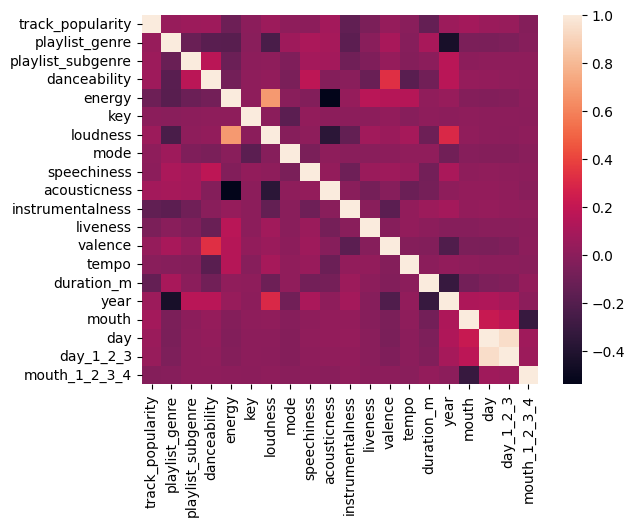

In [49]:
sns.heatmap(df.corr())

In [50]:
df.corr()

,track_popularity,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_m,year,mouth,day,day_1_2_3,mouth_1_2_3_4
track_popularity,1.000000,0.042438,0.058107,0.064748,-0.109112,-0.000650,0.057687,0.010637,0.006819,0.085159,-0.149872,-0.054584,0.033231,-0.005378,-0.137306,0.060744,0.081828,0.052654,0.042670,-0.022981
playlist_genre,0.042438,1.000000,-0.123840,-0.182478,-0.190426,-0.007412,-0.243377,0.065426,0.110447,0.094074,-0.170522,-0.009740,0.098330,-0.016678,0.101354,-0.441101,-0.056204,-0.061817,-0.046822,-0.021920
playlist_subgenre,0.058107,-0.123840,1.000000,0.168036,-0.118259,0.004877,0.011746,-0.045644,0.091411,0.081153,-0.095356,-0.041255,0.034856,-0.023192,-0.001564,0.163142,0.002533,0.013447,0.012829,0.012874
danceability,0.064748,-0.182478,0.168036,1.000000,-0.086073,0.011736,0.025335,-0.058647,0.181721,-0.024519,-0.008655,-0.123859,0.330523,-0.184084,-0.090890,0.161358,0.032040,0.025784,0.017404,0.011452
energy,-0.109112,-0.190426,-0.118259,-0.086073,1.000000,0.010052,0.676625,-0.004800,-0.032150,-0.539745,0.033247,0.161223,0.151103,0.149951,0.015598,0.041505,-0.026762,-0.032111,-0.026542,0.007101
key,-0.000650,-0.007412,0.004877,0.011736,0.010052,1.000000,0.000959,-0.174093,0.022607,0.004306,0.005968,0.002887,0.019914,-0.013370,0.013338,0.006461,0.009575,0.002017,0.002365,-0.003313
loudness,0.057687,-0.243377,0.011746,0.025335,0.676625,0.000959,1.000000,-0.019289,0.010339,-0.361638,-0.147824,0.077613,0.053384,0.093767,-0.108845,0.296717,0.016713,0.003113,0.000174,0.009442
mode,0.010637,0.065426,-0.045644,-0.058647,-0.004800,-0.174093,-0.019289,1.000000,-0.063512,0.009415,-0.006741,-0.005549,0.002614,0.014329,0.016713,-0.092272,-0.017503,-0.027238,-0.022533,-0.005101
speechiness,0.006819,0.110447,0.091411,0.181721,-0.032150,0.022607,0.010339,-0.063512,1.000000,0.026092,-0.103424,0.055426,0.064659,0.044603,-0.087191,0.106880,0.009048,0.014799,0.011179,0.004849
acousticness,0.085159,0.094074,0.081153,-0.024519,-0.539745,0.004306,-0.361638,0.009415,0.026092,1.000000,-0.006850,-0.077243,-0.016845,-0.112724,-0.079185,0.010294,0.026499,0.026922,0.017250,-0.007363


In [51]:
df.drop(['key'] , axis=1 ,inplace=True)

> Because they don't have a relationship with the play genre.

In [52]:
df.drop(['liveness'] , axis=1 ,inplace=True)

In [53]:
df.corr()

,track_popularity,playlist_genre,playlist_subgenre,danceability,energy,loudness,mode,speechiness,acousticness,instrumentalness,valence,tempo,duration_m,year,mouth,day,day_1_2_3,mouth_1_2_3_4
track_popularity,1.000000,0.042438,0.058107,0.064748,-0.109112,0.057687,0.010637,0.006819,0.085159,-0.149872,0.033231,-0.005378,-0.137306,0.060744,0.081828,0.052654,0.042670,-0.022981
playlist_genre,0.042438,1.000000,-0.123840,-0.182478,-0.190426,-0.243377,0.065426,0.110447,0.094074,-0.170522,0.098330,-0.016678,0.101354,-0.441101,-0.056204,-0.061817,-0.046822,-0.021920
playlist_subgenre,0.058107,-0.123840,1.000000,0.168036,-0.118259,0.011746,-0.045644,0.091411,0.081153,-0.095356,0.034856,-0.023192,-0.001564,0.163142,0.002533,0.013447,0.012829,0.012874
danceability,0.064748,-0.182478,0.168036,1.000000,-0.086073,0.025335,-0.058647,0.181721,-0.024519,-0.008655,0.330523,-0.184084,-0.090890,0.161358,0.032040,0.025784,0.017404,0.011452
energy,-0.109112,-0.190426,-0.118259,-0.086073,1.000000,0.676625,-0.004800,-0.032150,-0.539745,0.033247,0.151103,0.149951,0.015598,0.041505,-0.026762,-0.032111,-0.026542,0.007101
loudness,0.057687,-0.243377,0.011746,0.025335,0.676625,1.000000,-0.019289,0.010339,-0.361638,-0.147824,0.053384,0.093767,-0.108845,0.296717,0.016713,0.003113,0.000174,0.009442
mode,0.010637,0.065426,-0.045644,-0.058647,-0.004800,-0.019289,1.000000,-0.063512,0.009415,-0.006741,0.002614,0.014329,0.016713,-0.092272,-0.017503,-0.027238,-0.022533,-0.005101
speechiness,0.006819,0.110447,0.091411,0.181721,-0.032150,0.010339,-0.063512,1.000000,0.026092,-0.103424,0.064659,0.044603,-0.087191,0.106880,0.009048,0.014799,0.011179,0.004849
acousticness,0.085159,0.094074,0.081153,-0.024519,-0.539745,-0.361638,0.009415,0.026092,1.000000,-0.006850,-0.016845,-0.112724,-0.079185,0.010294,0.026499,0.026922,0.017250,-0.007363
instrumentalness,-0.149872,-0.170522,-0.095356,-0.008655,0.033247,-0.147824,-0.006741,-0.103424,-0.006850,1.000000,-0.175402,0.023335,0.059571,0.086060,0.027651,0.034639,0.023320,0.018257


In [54]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32833 entries, 0 to 32832
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   track_popularity   32833 non-null  int64  
 1   playlist_genre     32833 non-null  int64  
 2   playlist_subgenre  32833 non-null  int64  
 3   danceability       32833 non-null  float64
 4   energy             32833 non-null  float64
 5   loudness           32833 non-null  float64
 6   mode               32833 non-null  int64  
 7   speechiness        32833 non-null  float64
 8   acousticness       32833 non-null  float64
 9   instrumentalness   32833 non-null  float64
 10  valence            32833 non-null  float64
 11  tempo              32833 non-null  float64
 12  duration_m         32833 non-null  int64  
 13  year               32833 non-null  object 
 14  mouth              32833 non-null  object 
 15  day                32833 non-null  object 
 16  day_1_2_3          328

In [55]:
df['day']=df['day'].astype('int')
df['mouth']=df['mouth'].astype('int')
df['year']=df['year'].astype('int')

In [56]:
df.corr()

,track_popularity,playlist_genre,playlist_subgenre,danceability,energy,loudness,mode,speechiness,acousticness,instrumentalness,valence,tempo,duration_m,year,mouth,day,day_1_2_3,mouth_1_2_3_4
track_popularity,1.000000,0.042438,0.058107,0.064748,-0.109112,0.057687,0.010637,0.006819,0.085159,-0.149872,0.033231,-0.005378,-0.137306,0.060744,0.081828,0.052654,0.042670,-0.022981
playlist_genre,0.042438,1.000000,-0.123840,-0.182478,-0.190426,-0.243377,0.065426,0.110447,0.094074,-0.170522,0.098330,-0.016678,0.101354,-0.441101,-0.056204,-0.061817,-0.046822,-0.021920
playlist_subgenre,0.058107,-0.123840,1.000000,0.168036,-0.118259,0.011746,-0.045644,0.091411,0.081153,-0.095356,0.034856,-0.023192,-0.001564,0.163142,0.002533,0.013447,0.012829,0.012874
danceability,0.064748,-0.182478,0.168036,1.000000,-0.086073,0.025335,-0.058647,0.181721,-0.024519,-0.008655,0.330523,-0.184084,-0.090890,0.161358,0.032040,0.025784,0.017404,0.011452
energy,-0.109112,-0.190426,-0.118259,-0.086073,1.000000,0.676625,-0.004800,-0.032150,-0.539745,0.033247,0.151103,0.149951,0.015598,0.041505,-0.026762,-0.032111,-0.026542,0.007101
loudness,0.057687,-0.243377,0.011746,0.025335,0.676625,1.000000,-0.019289,0.010339,-0.361638,-0.147824,0.053384,0.093767,-0.108845,0.296717,0.016713,0.003113,0.000174,0.009442
mode,0.010637,0.065426,-0.045644,-0.058647,-0.004800,-0.019289,1.000000,-0.063512,0.009415,-0.006741,0.002614,0.014329,0.016713,-0.092272,-0.017503,-0.027238,-0.022533,-0.005101
speechiness,0.006819,0.110447,0.091411,0.181721,-0.032150,0.010339,-0.063512,1.000000,0.026092,-0.103424,0.064659,0.044603,-0.087191,0.106880,0.009048,0.014799,0.011179,0.004849
acousticness,0.085159,0.094074,0.081153,-0.024519,-0.539745,-0.361638,0.009415,0.026092,1.000000,-0.006850,-0.016845,-0.112724,-0.079185,0.010294,0.026499,0.026922,0.017250,-0.007363
instrumentalness,-0.149872,-0.170522,-0.095356,-0.008655,0.033247,-0.147824,-0.006741,-0.103424,-0.006850,1.000000,-0.175402,0.023335,0.059571,0.086060,0.027651,0.034639,0.023320,0.018257


In [57]:
df.columns

Index(['track_popularity', 'playlist_genre', 'playlist_subgenre',
       'danceability', 'energy', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'valence', 'tempo', 'duration_m',
       'year', 'mouth', 'day', 'day_1_2_3', 'mouth_1_2_3_4'],
      dtype='object')

**first Observing the outliers**

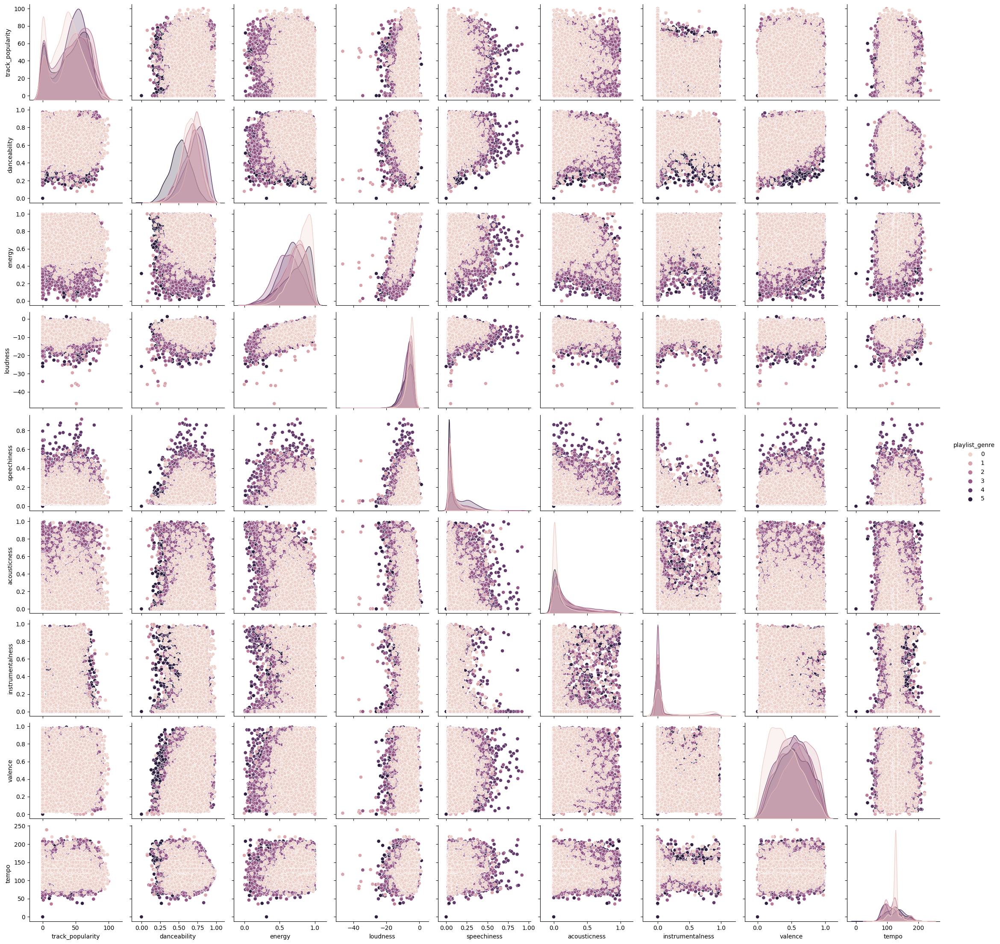

In [58]:
df_sns = df.loc[:, ['track_popularity', 'playlist_genre',
                'danceability', 'energy', 'loudness', 'speechiness',
                'acousticness', 'instrumentalness', 'valence', 'tempo']]

# Visualize a scatterplot matrix
sns.pairplot(data=df_sns, hue='playlist_genre')
plt.show()

In [59]:
df_pre = df.copy()

In [60]:
df_pre.columns

Index(['track_popularity', 'playlist_genre', 'playlist_subgenre',
       'danceability', 'energy', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'valence', 'tempo', 'duration_m',
       'year', 'mouth', 'day', 'day_1_2_3', 'mouth_1_2_3_4'],
      dtype='object')

In [61]:
df_pre[(df_pre['tempo'] >= 50) & (df_pre['tempo'] <= 260)]

,track_popularity,playlist_genre,playlist_subgenre,danceability,energy,loudness,mode,speechiness,acousticness,instrumentalness,valence,tempo,duration_m,year,mouth,day,day_1_2_3,mouth_1_2_3_4
0,66,2,3,0.748,0.916,-2.634,1,0.0583,0.102000,0.000000,0.5180,122.036,3,2019,6,14,2,4
1,67,2,3,0.726,0.815,-4.969,1,0.0373,0.072400,0.004210,0.6930,99.972,3,2019,12,13,2,2
2,70,2,3,0.675,0.931,-3.432,0,0.0742,0.079400,0.000023,0.6130,124.008,3,2019,7,5,1,4
3,60,2,3,0.718,0.930,-3.778,1,0.1020,0.028700,0.000009,0.2770,121.956,3,2019,7,19,2,4
4,69,2,3,0.650,0.833,-4.672,1,0.0359,0.080300,0.000000,0.7250,123.976,3,2019,3,5,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32828,42,0,18,0.428,0.922,-1.814,1,0.0936,0.076600,0.000000,0.2100,128.170,3,2014,4,28,3,3
32829,20,0,18,0.522,0.786,-4.462,1,0.0420,0.001710,0.004270,0.4000,128.041,6,2013,3,8,1,3
32830,14,0,18,0.529,0.821,-4.899,0,0.0481,0.108000,0.000001,0.4360,127.989,4,2014,4,21,3,3
32831,15,0,18,0.626,0.888,-3.361,1,0.1090,0.007920,0.127000,0.3080,128.008,6,2014,1,1,1,2


In [62]:
df_pre[(df_pre['speechiness'] >= 0) & (df_pre['speechiness'] <= 0.75)]

,track_popularity,playlist_genre,playlist_subgenre,danceability,energy,loudness,mode,speechiness,acousticness,instrumentalness,valence,tempo,duration_m,year,mouth,day,day_1_2_3,mouth_1_2_3_4
0,66,2,3,0.748,0.916,-2.634,1,0.0583,0.102000,0.000000,0.5180,122.036,3,2019,6,14,2,4
1,67,2,3,0.726,0.815,-4.969,1,0.0373,0.072400,0.004210,0.6930,99.972,3,2019,12,13,2,2
2,70,2,3,0.675,0.931,-3.432,0,0.0742,0.079400,0.000023,0.6130,124.008,3,2019,7,5,1,4
3,60,2,3,0.718,0.930,-3.778,1,0.1020,0.028700,0.000009,0.2770,121.956,3,2019,7,19,2,4
4,69,2,3,0.650,0.833,-4.672,1,0.0359,0.080300,0.000000,0.7250,123.976,3,2019,3,5,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32828,42,0,18,0.428,0.922,-1.814,1,0.0936,0.076600,0.000000,0.2100,128.170,3,2014,4,28,3,3
32829,20,0,18,0.522,0.786,-4.462,1,0.0420,0.001710,0.004270,0.4000,128.041,6,2013,3,8,1,3
32830,14,0,18,0.529,0.821,-4.899,0,0.0481,0.108000,0.000001,0.4360,127.989,4,2014,4,21,3,3
32831,15,0,18,0.626,0.888,-3.361,1,0.1090,0.007920,0.127000,0.3080,128.008,6,2014,1,1,1,2


In [63]:
df_pre[df_pre['loudness']> -25]

,track_popularity,playlist_genre,playlist_subgenre,danceability,energy,loudness,mode,speechiness,acousticness,instrumentalness,valence,tempo,duration_m,year,mouth,day,day_1_2_3,mouth_1_2_3_4
0,66,2,3,0.748,0.916,-2.634,1,0.0583,0.102000,0.000000,0.5180,122.036,3,2019,6,14,2,4
1,67,2,3,0.726,0.815,-4.969,1,0.0373,0.072400,0.004210,0.6930,99.972,3,2019,12,13,2,2
2,70,2,3,0.675,0.931,-3.432,0,0.0742,0.079400,0.000023,0.6130,124.008,3,2019,7,5,1,4
3,60,2,3,0.718,0.930,-3.778,1,0.1020,0.028700,0.000009,0.2770,121.956,3,2019,7,19,2,4
4,69,2,3,0.650,0.833,-4.672,1,0.0359,0.080300,0.000000,0.7250,123.976,3,2019,3,5,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32828,42,0,18,0.428,0.922,-1.814,1,0.0936,0.076600,0.000000,0.2100,128.170,3,2014,4,28,3,3
32829,20,0,18,0.522,0.786,-4.462,1,0.0420,0.001710,0.004270,0.4000,128.041,6,2013,3,8,1,3
32830,14,0,18,0.529,0.821,-4.899,0,0.0481,0.108000,0.000001,0.4360,127.989,4,2014,4,21,3,3
32831,15,0,18,0.626,0.888,-3.361,1,0.1090,0.007920,0.127000,0.3080,128.008,6,2014,1,1,1,2


In [64]:
df_pre[df_pre['danceability']>0]

,track_popularity,playlist_genre,playlist_subgenre,danceability,energy,loudness,mode,speechiness,acousticness,instrumentalness,valence,tempo,duration_m,year,mouth,day,day_1_2_3,mouth_1_2_3_4
0,66,2,3,0.748,0.916,-2.634,1,0.0583,0.102000,0.000000,0.5180,122.036,3,2019,6,14,2,4
1,67,2,3,0.726,0.815,-4.969,1,0.0373,0.072400,0.004210,0.6930,99.972,3,2019,12,13,2,2
2,70,2,3,0.675,0.931,-3.432,0,0.0742,0.079400,0.000023,0.6130,124.008,3,2019,7,5,1,4
3,60,2,3,0.718,0.930,-3.778,1,0.1020,0.028700,0.000009,0.2770,121.956,3,2019,7,19,2,4
4,69,2,3,0.650,0.833,-4.672,1,0.0359,0.080300,0.000000,0.7250,123.976,3,2019,3,5,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32828,42,0,18,0.428,0.922,-1.814,1,0.0936,0.076600,0.000000,0.2100,128.170,3,2014,4,28,3,3
32829,20,0,18,0.522,0.786,-4.462,1,0.0420,0.001710,0.004270,0.4000,128.041,6,2013,3,8,1,3
32830,14,0,18,0.529,0.821,-4.899,0,0.0481,0.108000,0.000001,0.4360,127.989,4,2014,4,21,3,3
32831,15,0,18,0.626,0.888,-3.361,1,0.1090,0.007920,0.127000,0.3080,128.008,6,2014,1,1,1,2


In [65]:


# Filtering outliers for the 'tempo' column
df_pre = df_pre[(df_pre['tempo'] >= 50) & (df_pre['tempo'] <= 260)]

# Filtering outliers for the 'speechiness' column
df_pre = df_pre[(df_pre['speechiness'] >= 0) & (df_pre['speechiness'] <= 0.75)]

# Filtering values for the 'loudness' column
df_pre = df_pre[df_pre['loudness'] > -25]

# Filtering values for the 'danceability' column
df_pre = df_pre[df_pre['danceability'] > 0]



In [66]:
df_pre.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32796 entries, 0 to 32832
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   track_popularity   32796 non-null  int64  
 1   playlist_genre     32796 non-null  int64  
 2   playlist_subgenre  32796 non-null  int64  
 3   danceability       32796 non-null  float64
 4   energy             32796 non-null  float64
 5   loudness           32796 non-null  float64
 6   mode               32796 non-null  int64  
 7   speechiness        32796 non-null  float64
 8   acousticness       32796 non-null  float64
 9   instrumentalness   32796 non-null  float64
 10  valence            32796 non-null  float64
 11  tempo              32796 non-null  float64
 12  duration_m         32796 non-null  int64  
 13  year               32796 non-null  int64  
 14  mouth              32796 non-null  int64  
 15  day                32796 non-null  int64  
 16  day_1_2_3          32796 no

In [67]:
df_pre

,track_popularity,playlist_genre,playlist_subgenre,danceability,energy,loudness,mode,speechiness,acousticness,instrumentalness,valence,tempo,duration_m,year,mouth,day,day_1_2_3,mouth_1_2_3_4
0,66,2,3,0.748,0.916,-2.634,1,0.0583,0.102000,0.000000,0.5180,122.036,3,2019,6,14,2,4
1,67,2,3,0.726,0.815,-4.969,1,0.0373,0.072400,0.004210,0.6930,99.972,3,2019,12,13,2,2
2,70,2,3,0.675,0.931,-3.432,0,0.0742,0.079400,0.000023,0.6130,124.008,3,2019,7,5,1,4
3,60,2,3,0.718,0.930,-3.778,1,0.1020,0.028700,0.000009,0.2770,121.956,3,2019,7,19,2,4
4,69,2,3,0.650,0.833,-4.672,1,0.0359,0.080300,0.000000,0.7250,123.976,3,2019,3,5,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32828,42,0,18,0.428,0.922,-1.814,1,0.0936,0.076600,0.000000,0.2100,128.170,3,2014,4,28,3,3
32829,20,0,18,0.522,0.786,-4.462,1,0.0420,0.001710,0.004270,0.4000,128.041,6,2013,3,8,1,3
32830,14,0,18,0.529,0.821,-4.899,0,0.0481,0.108000,0.000001,0.4360,127.989,4,2014,4,21,3,3
32831,15,0,18,0.626,0.888,-3.361,1,0.1090,0.007920,0.127000,0.3080,128.008,6,2014,1,1,1,2


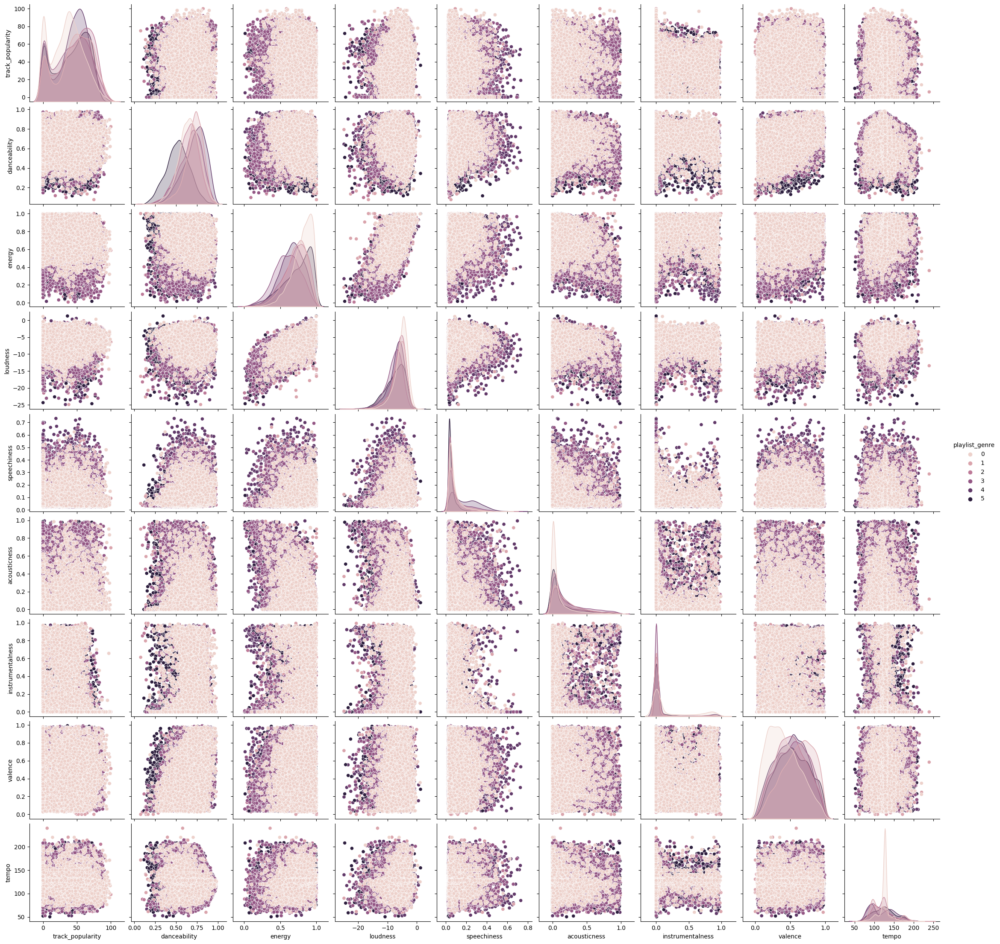

In [68]:
# Selecting specific columns including 'playlist_genre'
df_sns = df_pre[['track_popularity', 'playlist_genre',
                'danceability', 'energy', 'loudness', 'speechiness',
                'acousticness', 'instrumentalness', 'valence', 'tempo']]
# Visualize a scatterplot matrix
sns.pairplot(data=df_sns, hue='playlist_genre')
plt.show()

In [69]:
df.corr()

,track_popularity,playlist_genre,playlist_subgenre,danceability,energy,loudness,mode,speechiness,acousticness,instrumentalness,valence,tempo,duration_m,year,mouth,day,day_1_2_3,mouth_1_2_3_4
track_popularity,1.000000,0.042438,0.058107,0.064748,-0.109112,0.057687,0.010637,0.006819,0.085159,-0.149872,0.033231,-0.005378,-0.137306,0.060744,0.081828,0.052654,0.042670,-0.022981
playlist_genre,0.042438,1.000000,-0.123840,-0.182478,-0.190426,-0.243377,0.065426,0.110447,0.094074,-0.170522,0.098330,-0.016678,0.101354,-0.441101,-0.056204,-0.061817,-0.046822,-0.021920
playlist_subgenre,0.058107,-0.123840,1.000000,0.168036,-0.118259,0.011746,-0.045644,0.091411,0.081153,-0.095356,0.034856,-0.023192,-0.001564,0.163142,0.002533,0.013447,0.012829,0.012874
danceability,0.064748,-0.182478,0.168036,1.000000,-0.086073,0.025335,-0.058647,0.181721,-0.024519,-0.008655,0.330523,-0.184084,-0.090890,0.161358,0.032040,0.025784,0.017404,0.011452
energy,-0.109112,-0.190426,-0.118259,-0.086073,1.000000,0.676625,-0.004800,-0.032150,-0.539745,0.033247,0.151103,0.149951,0.015598,0.041505,-0.026762,-0.032111,-0.026542,0.007101
loudness,0.057687,-0.243377,0.011746,0.025335,0.676625,1.000000,-0.019289,0.010339,-0.361638,-0.147824,0.053384,0.093767,-0.108845,0.296717,0.016713,0.003113,0.000174,0.009442
mode,0.010637,0.065426,-0.045644,-0.058647,-0.004800,-0.019289,1.000000,-0.063512,0.009415,-0.006741,0.002614,0.014329,0.016713,-0.092272,-0.017503,-0.027238,-0.022533,-0.005101
speechiness,0.006819,0.110447,0.091411,0.181721,-0.032150,0.010339,-0.063512,1.000000,0.026092,-0.103424,0.064659,0.044603,-0.087191,0.106880,0.009048,0.014799,0.011179,0.004849
acousticness,0.085159,0.094074,0.081153,-0.024519,-0.539745,-0.361638,0.009415,0.026092,1.000000,-0.006850,-0.016845,-0.112724,-0.079185,0.010294,0.026499,0.026922,0.017250,-0.007363
instrumentalness,-0.149872,-0.170522,-0.095356,-0.008655,0.033247,-0.147824,-0.006741,-0.103424,-0.006850,1.000000,-0.175402,0.023335,0.059571,0.086060,0.027651,0.034639,0.023320,0.018257


In [70]:
df_pre.to_csv("spotify_pre1.csv", index=False)
